In [ ]:
# Author: Jinghui Wang
# Student ID: 521021910571
# Date: 2024/1/14

# DIP Homework: Lego Classification


How to run this code:
* Make sure you run in `Colab`, and connect to GPU. Fortunately, it is free. XD
* Make sure your network is OK.
* Each code block implements a subfunction of the task respectively and outputs intermediate results.

To be specific:
* `Environment Setup` -> `Subfunctions`. Check the intermediate results.
* `Environment Setup` -> `Complete Code`. Check the final results of all test images.

## Environment Setup
The following code blocks help you install the necessary environment. It may takes a few minutes, because it download big files (like models) from the Internet. Please check the output to make sure environment has been set up successfully.

In [1]:
# 搭建运行环境

use_colab = True    # 如果使用Colab，这里就设置为True

import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())

if use_colab:

    import subprocess
    import os
    import sys
    # 安装必要的库
    subprocess.run([sys.executable, '-m', 'pip', 'install', 'opencv-python', 'matplotlib'])
    subprocess.run([sys.executable, '-m', 'pip', 'install', 'git+https://github.com/facebookresearch/segment-anything.git'])

    # 创建目录
    if not os.path.exists('test_images'):
        os.mkdir('test_images')
    if not os.path.exists('models'):
        os.mkdir('models')

    # 下载测试图像
    image_base_url = "https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/"
    for i in range(1, 11):
        image_url = image_base_url + f'{i}.jpg'
        result = subprocess.run(['wget', '-P', 'test_images', image_url])
        if result.returncode != 0:
            print(f"Failure:{image_url}")
        else:
            print(f"Download successfully:{image_url}")

    # 下载训练好的分类器
    classifier_url = "https://github.com/huigg296/Lego-Classification/releases/download/v1.0/classifier.pth"
    result = subprocess.run(['wget', '-P', 'models', classifier_url])
    if result.returncode != 0:
        print(f"Failure:{classifier_url}")
    else:
        print(f"Download successfully:{classifier_url}")

    # 下载sam预训练模型
    sam_url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
    result = subprocess.run(['wget', '-P', 'models', sam_url])
    if result.returncode != 0:
        print(f"Failure:{sam_url}")
    else:
        print(f"Download successfully:{sam_url}")

import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image, ImageDraw
import pandas as pd
from collections import Counter


PyTorch version: 2.1.0+cu121
Torchvision version: 0.16.0+cu121
CUDA is available: True
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/1.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/2.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/3.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/4.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/5.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/6.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/7.jpg
Download successfully:https://raw.githubusercontent.com/huigg296/Lego-Classification/main/test_images/8.jpg
Download successfully:https://raw.githubuserconte

## Subfunctions
The codes below take `test_images/5.jpg` as an example to show how the code runs.

### Image Preprocess
Preprocess image to make it easier to classify Legos:
* **Image resize**. The original image is too big, the limited memory of GPU cannot process it with SAM. Thus, I resize the image to make it smaller.
* **Gamma correction**. In order to reduce the impact of shadows, execute gamma transform with `gamma > 1`. Howerer, the effect is not as expected. Finally, I decide not to use it and let `gamma = 1`.


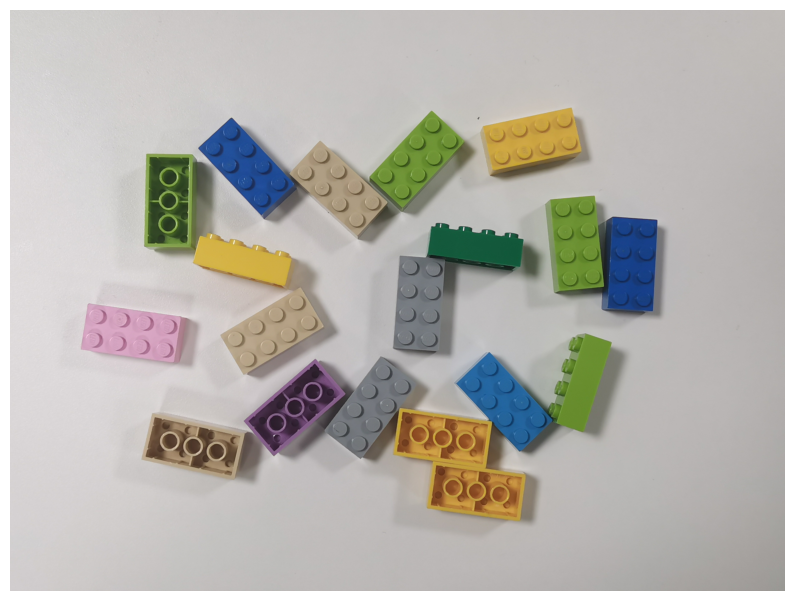

In [2]:
def gamma_correction(image, gamma=1.0):
    # 构建查找表，实现伽马校正
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")

    # 应用伽马校正
    return cv2.LUT(image, table)

image_path = "test_images/5.jpg"

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

new_width = int(image.shape[1] * 0.5)
new_height = int(image.shape[0] * 0.5)
new_dimensions = (new_width, new_height)

# 等比例缩放图像
image = cv2.resize(image, new_dimensions, interpolation=cv2.INTER_AREA)
# 伽马校正
image = gamma_correction(image, gamma=1)
# print(image.shape)
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('off')
plt.show()

torch.cuda.empty_cache() # 清空未使用的显存

### Model Creating
* Create SAM
    * The parameters has been finetuned.
* Create classifier
    * It is a ResNet50 I trained before.

In [3]:
# 创建SAM

sam_checkpoint = "models/sam_vit_h_4b8939.pth"
sam_model_type = "vit_h"
sam_device = "cuda"

sam = sam_model_registry[sam_model_type](checkpoint=sam_checkpoint)
sam.to(device=sam_device)
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    points_per_batch=64,
    box_nms_thresh = 0.4,
    stability_score_thresh = 0.97,
    pred_iou_thresh=0.97,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    # min_mask_region_area=500,  # Requires open-cv to run post-processing
)

In [4]:
# 创建分类器模型

classifier_path = 'models/classifier.pth'
num_classes = 22

# 创建模型实例
classifier = models.resnet50(pretrained=False)
# 修改第一层以接受单通道图像
classifier.conv1 = nn.Conv2d(1, classifier.conv1.out_channels, kernel_size=classifier.conv1.kernel_size,
                        stride=classifier.conv1.stride, padding=classifier.conv1.padding, bias=False)

num_ftrs = classifier.fc.in_features
classifier.fc = torch.nn.Linear(num_ftrs, num_classes)

# 加载模型的 state_dict
classifier.load_state_dict(torch.load(classifier_path))
# 设置模型为预测模式
classifier.eval()

# 预处理函数
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=1),  # 转换为单通道灰度图像
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# 预测函数
def predict(model, image):
    image_tensor = transform(image).unsqueeze(0)
    outputs = model(image_tensor)
    _, predicted = torch.max(outputs.data, 1)
    return predicted.item()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [5]:
# 预测类别字典
class_dict = [
    '17485',
    '2456',
    '2730',
    '3001',
    '3002',
    '3003',
    '3004',
    '3006',
    '3007',
    '3009',
    '3010',
    '30414',
    '3622',
    '45176',
    '4600',
    '55981',
    '56145',
    '56891',
    '57520',
    '6111',
    '70695',
    '87079'
]
lego_dict = {
    '17485': 'Brick2x2Hole',
    '2456': 'Brick2x6',
    '2730': 'Brick1x10Hole',
    '3001': 'Brick2x4',
    '3002': 'Brick2x3',
    '3003': 'Brick2x2',
    '3004': 'Brick1x2',
    '3006': 'Brick2x10',
    '3007': 'Brick2x8',
    '3009': 'Brick1x6',
    '3010': 'Brick1x4',
    '30414': 'Brick1x4Stud',
    '3622': 'Brick1x3',
    '45176': 'Cone',
    '4600': 'PlateWheelPin',
    '55981': 'WheelRim14x18',
    '56145': 'WheelRim20x30',
    '56891': 'Tyre18',
    '57520': 'Wheel25.4',
    '6111': 'Brick1x10',
    '70695': 'Tyre26',
    '87079': 'Tile'
}

### Image Segmentation
SAM works to segment Legos from image, which takes about 1 minute.

In [6]:
# 展示分割后的掩膜
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

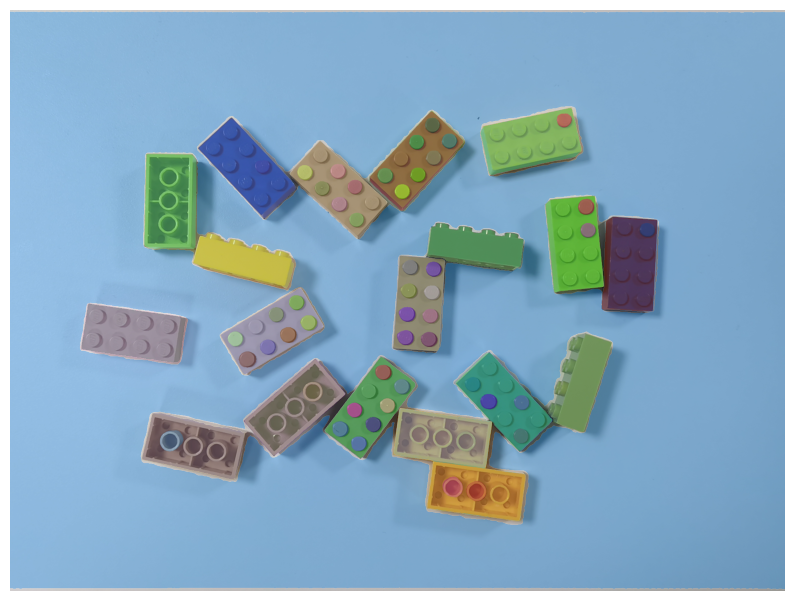

In [7]:
# 图像分割
masks = mask_generator.generate(image)

plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

torch.cuda.empty_cache() # 清空未使用的显存

### Legos Prediction
* Postprocess. Filtered segmentations with low quality.
* Crop images with a single Lego.
* Predict Lego in each cropped image.

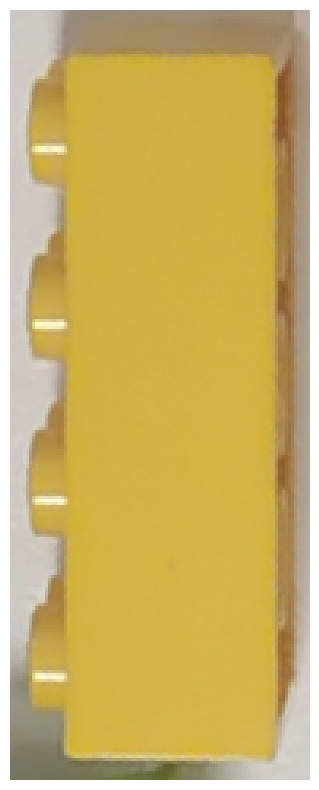

Brick1x4


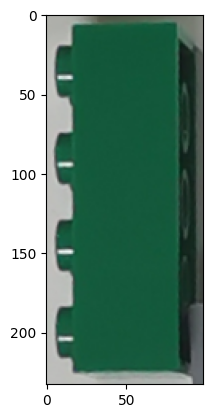

Brick1x4Stud


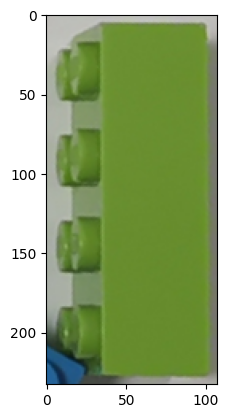

Brick1x4


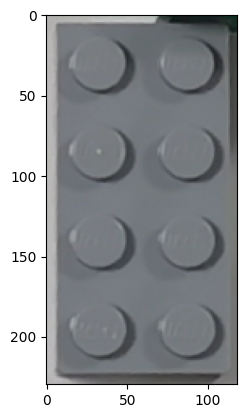

Brick2x4


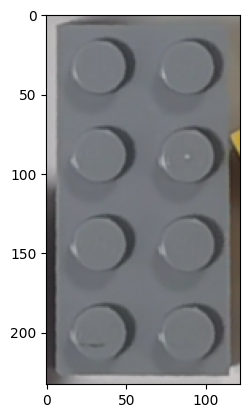

Brick2x4


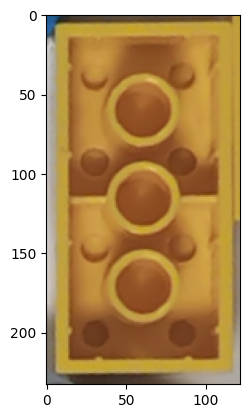

Brick2x4


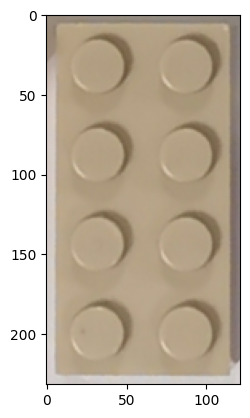

Brick2x4


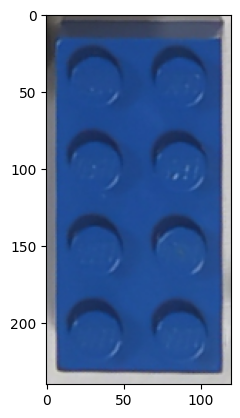

Brick2x4


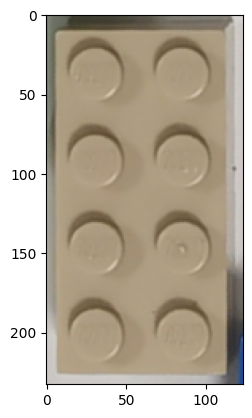

Brick2x4


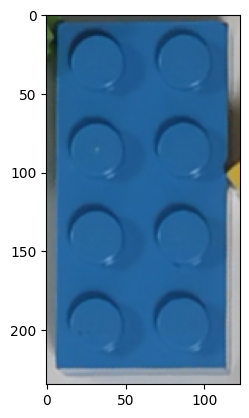

Brick2x4


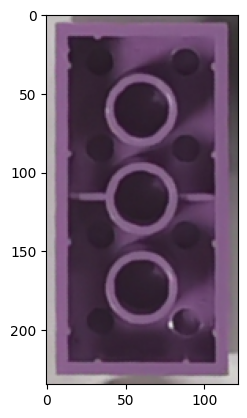

Brick2x4


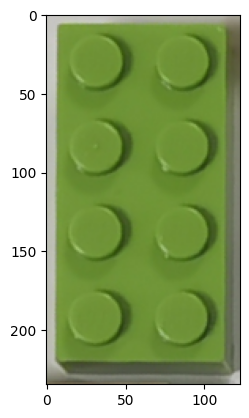

Brick2x4


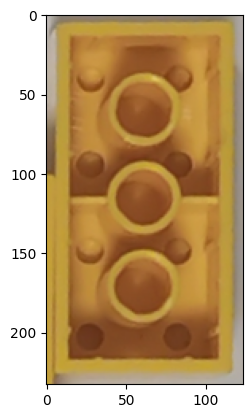

Brick2x4


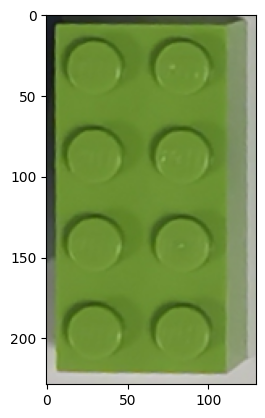

Brick2x4


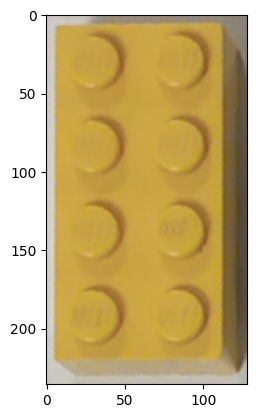

Brick2x4


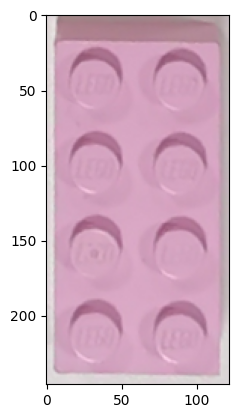

Brick2x4
Segmentation 16 is filtered.


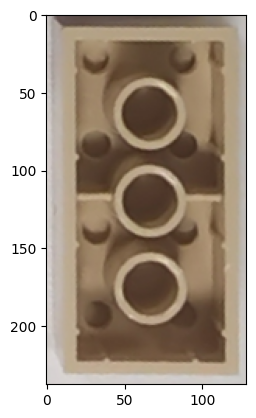

Brick2x4


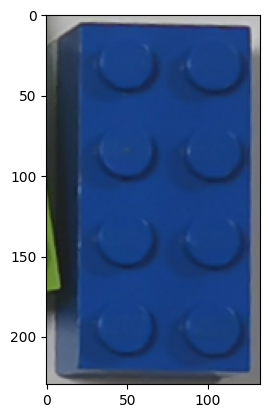

Brick2x4


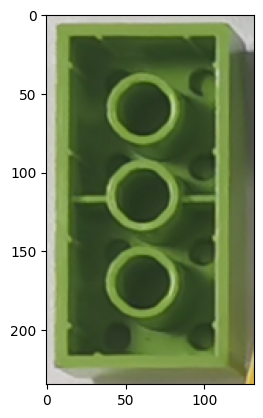

Brick2x4
Segmentation 20 is filtered.


In [8]:
# 滤除质量不高的分割结果，然后分割出每块积木图像并进行预测
def lego_crop(mask, image, margin):
    '''
    从掩膜获取积木分割图像
    Input: mask    积木分割二值化掩膜
        image    原始图像
        margin   生成矩形框边距
    Output: crop_image 分割出的积木图像
    '''
    # 在掩膜上寻找轮廓
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        contour = max(contours, key=cv2.contourArea)

    rect = cv2.minAreaRect(contour)  # 检测轮廓最小外接矩形，得到最小外接矩形的中心(x,y), (宽,高), 旋转角度
    box = np.intp(cv2.boxPoints(rect))  # 获取最小外接矩形的4个顶点坐标

    h, w = image.shape[:2]  # 原图像的高和宽
    rect_w, rect_h = int(rect[1][0]) + 1, int(rect[1][1]) + 1  # 最小外接矩形的宽和高

    if rect_w <= rect_h:
        # 图像旋转
        x, y = int(box[1][0]), int(box[1][1])
        M2 = cv2.getRotationMatrix2D((x, y), rect[2], 1)
        rotated_image = cv2.warpAffine(image, M2, (w * 2, h * 2))
        # 截取积木图片
        y1, y2 = y - margin if y - margin > 0 else 0, y + rect_h + margin + 1
        x1, x2 = x - margin if x - margin > 0 else 0, x + rect_w + margin + 1
        crop_image = rotated_image[y1: y2, x1: x2]
    else:
        # 图像旋转
        x, y = int(box[2][0]), int(box[2][1])
        M2 = cv2.getRotationMatrix2D((x, y), rect[2] + 90, 1)
        rotated_image = cv2.warpAffine(image, M2, (w * 2, h * 2))
        # 截取积木图片
        y1, y2 = y - margin if y - margin > 0 else 0, y + rect_w + margin + 1
        x1, x2 = x - margin if x - margin > 0 else 0, x + rect_h + margin + 1
        crop_image = rotated_image[y1: y2, x1: x2]

    return Image.fromarray(crop_image)

# 滤除面积过小的mask，并使masks按面积降序排列
masks[:] = [mask for mask in masks if mask['area'] >= 3400]
masks = sorted(masks, key=(lambda x: x['area']), reverse=False)
masks.pop(-1)  # 弹出面积最大的mask，用于滤除背景

plt.figure(figsize=(10,10))
plt.axis('off')

# 初始化
occupied_areas = np.zeros_like(image[:,:,0])    # 记录已经占用的图像区域
overlap_threshold = 3400     # 过滤图像重叠的阈值
filtered_masks = []     # 过滤后的掩膜字典
lego_predict = []

for index, mask in enumerate(masks):

    # 转化为二值化掩膜
    binary_mask = np.uint8(mask['segmentation'])*255

    # 如果有大面积重叠，则跳过当前积木
    overlap_area = np.sum(np.logical_and(occupied_areas, binary_mask))
    if overlap_area > overlap_threshold:
        print('Segmentation', index, 'is filtered.')
        # plt.imshow(occupied_areas)
        # plt.show()
        # print(overlap_area)
        continue

    # 将通过条件的mask加入到filtered_masks中
    filtered_masks.append(mask)

    crop_image = lego_crop(binary_mask, image, margin=5)
    plt.imshow(crop_image)
    plt.show()
    predicted_class_idx = predict(classifier, crop_image)
    lego_id = class_dict[predicted_class_idx]
    lego_predict.append(lego_dict[lego_id])
    print(lego_predict[-1])


    # 更新已占用区域
    occupied_areas = np.logical_or(occupied_areas, binary_mask)





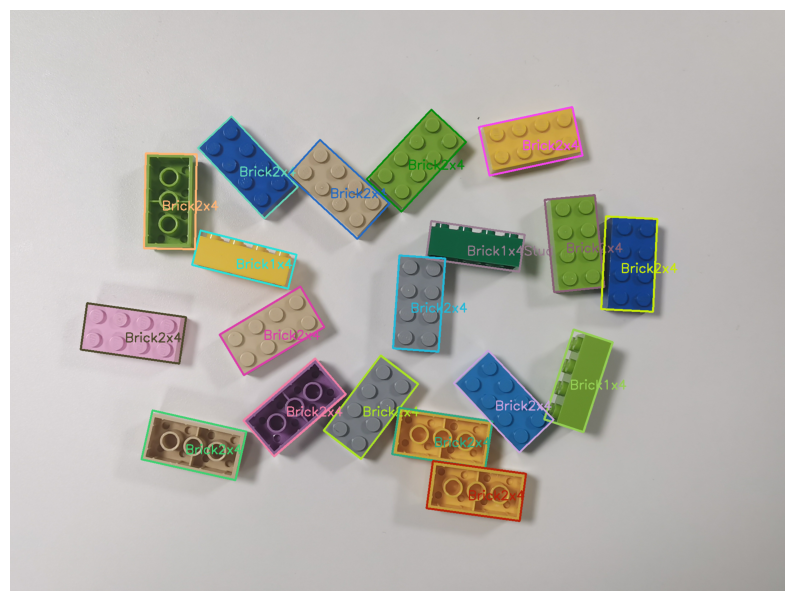

In [9]:
# 展示最终结果
def draw_result(masks, image, predict, margin, font_scale=1, random_color=False):
    '''
    在输入图像上绘制每个积木的边界框
    Input: masks    SAM预测输出的掩膜字典
        image    原始图像
        margin   生成矩形框边距
        random_color 选择是否用随机颜色绘制
        predict    预测的类别文本列表
        font_scale  字体缩放大小
    Output: rect_image 绘制矩形框后的图像
    '''
    for index, mask in enumerate(masks):

        # 转化为二值图像
        binary_mask = np.uint8(mask['segmentation'])*255
        # 在掩膜上寻找轮廓
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # 绘制矩形框
        if contours:
            contour = max(contours, key=cv2.contourArea)
        rect = cv2.minAreaRect(contour)              # 检测轮廓最小外接矩形，得到最小外接矩形的中心(x,y), (宽,高), 旋转角度
        box = np.intp(cv2.boxPoints(rect))              # 获取最小外接矩形的4个顶点坐标
        # 绘制颜色
        if random_color:
            color = tuple(np.random.randint(0, 256, 3).tolist())
        else:
            color = (255, 0, 0)

        cv2.drawContours(image, [box], 0, color, 3)  # 绘制轮廓最小外接矩形

        # 确定文字位置（长方形的中心）
        text_pos = (int(rect[0][0]), int(rect[0][1]))
        # 调整位置留出一些边距
        text_pos = (text_pos[0] - 20, text_pos[1] + 20)

        # 在长方形的左上角写上类别
        cv2.putText(image, predict[index], text_pos, cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, 2)

    return image

plt.figure(figsize=(10,10))
plt.axis('off')
result_image = image.copy()
result_image = draw_result(filtered_masks, result_image, lego_predict, margin=5, random_color=True)
plt.imshow(result_image)
plt.show()



## Complete Code
Process the ten test images and output the result.

In [10]:
def gamma_correction(image, gamma=1.0):
    # 构建查找表，实现伽马校正
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255
                    for i in np.arange(0, 256)]).astype("uint8")

    # 应用伽马校正
    return cv2.LUT(image, table)

# 展示分割后的掩膜
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)


# 滤除质量不高的分割结果，然后分割出每块积木图像并进行预测
def lego_crop(mask, image, margin):
    '''
    从掩膜获取积木分割图像
    Input: mask    积木分割二值化掩膜
        image    原始图像
        margin   生成矩形框边距
    Output: crop_image 分割出的积木图像
    '''
    # 在掩膜上寻找轮廓
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        contour = max(contours, key=cv2.contourArea)

    rect = cv2.minAreaRect(contour)  # 检测轮廓最小外接矩形，得到最小外接矩形的中心(x,y), (宽,高), 旋转角度
    box = np.intp(cv2.boxPoints(rect))  # 获取最小外接矩形的4个顶点坐标

    h, w = image.shape[:2]  # 原图像的高和宽
    rect_w, rect_h = int(rect[1][0]) + 1, int(rect[1][1]) + 1  # 最小外接矩形的宽和高

    if rect_w <= rect_h:
        # 图像旋转
        x, y = int(box[1][0]), int(box[1][1])
        M2 = cv2.getRotationMatrix2D((x, y), rect[2], 1)
        rotated_image = cv2.warpAffine(image, M2, (w * 2, h * 2))
        # 截取积木图片
        y1, y2 = y - margin if y - margin > 0 else 0, y + rect_h + margin + 1
        x1, x2 = x - margin if x - margin > 0 else 0, x + rect_w + margin + 1
        crop_image = rotated_image[y1: y2, x1: x2]
    else:
        # 图像旋转
        x, y = int(box[2][0]), int(box[2][1])
        M2 = cv2.getRotationMatrix2D((x, y), rect[2] + 90, 1)
        rotated_image = cv2.warpAffine(image, M2, (w * 2, h * 2))
        # 截取积木图片
        y1, y2 = y - margin if y - margin > 0 else 0, y + rect_w + margin + 1
        x1, x2 = x - margin if x - margin > 0 else 0, x + rect_h + margin + 1
        crop_image = rotated_image[y1: y2, x1: x2]

    return Image.fromarray(crop_image)


# 展示最终结果
def draw_result(masks, image, predict, margin, font_scale=1, random_color=False):
    '''
    在输入图像上绘制每个积木的边界框
    Input: masks    SAM预测输出的掩膜字典
        image    原始图像
        margin   生成矩形框边距
        random_color 选择是否用随机颜色绘制
        predict    预测的类别文本列表
        font_scale  字体缩放大小
    Output: rect_image 绘制矩形框后的图像
    '''
    for index, mask in enumerate(masks):

        # 转化为二值图像
        binary_mask = np.uint8(mask['segmentation'])*255
        # 在掩膜上寻找轮廓
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # 绘制矩形框
        if contours:
            contour = max(contours, key=cv2.contourArea)
        rect = cv2.minAreaRect(contour)              # 检测轮廓最小外接矩形，得到最小外接矩形的中心(x,y), (宽,高), 旋转角度
        box = np.intp(cv2.boxPoints(rect))              # 获取最小外接矩形的4个顶点坐标
        # 绘制颜色
        if random_color:
            color = tuple(np.random.randint(0, 256, 3).tolist())
        else:
            color = (255, 0, 0)

        cv2.drawContours(image, [box], 0, color, 3)  # 绘制轮廓最小外接矩形

        # 确定文字位置（长方形的中心）
        text_pos = (int(rect[0][0]), int(rect[0][1]))
        # 调整位置留出一些边距
        text_pos = (text_pos[0] - 20, text_pos[1] + 20)

        # 在长方形的左上角写上类别
        cv2.putText(image, predict[index], text_pos, cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, 2)

    return image


In [11]:
# 预测类别字典
class_dict = [
    '17485',
    '2456',
    '2730',
    '3001',
    '3002',
    '3003',
    '3004',
    '3006',
    '3007',
    '3009',
    '3010',
    '30414',
    '3622',
    '45176',
    '4600',
    '55981',
    '56145',
    '56891',
    '57520',
    '6111',
    '70695',
    '87079'
]
lego_dict = {
    '17485': 'Brick2x2Hole',
    '2456': 'Brick2x6',
    '2730': 'Brick1x10Hole',
    '3001': 'Brick2x4',
    '3002': 'Brick2x3',
    '3003': 'Brick2x2',
    '3004': 'Brick1x2',
    '3006': 'Brick2x10',
    '3007': 'Brick2x8',
    '3009': 'Brick1x6',
    '3010': 'Brick1x4',
    '30414': 'Brick1x4Stud',
    '3622': 'Brick1x3',
    '45176': 'Cone',
    '4600': 'PlateWheelPin',
    '55981': 'WheelRim14x18',
    '56145': 'WheelRim20x30',
    '56891': 'Tyre18',
    '57520': 'Wheel25.4',
    '6111': 'Brick1x10',
    '70695': 'Tyre26',
    '87079': 'Tile'
}

In [12]:
# 创建SAM

sam_checkpoint = "models/sam_vit_h_4b8939.pth"
sam_model_type = "vit_h"
sam_device = "cuda"

sam = sam_model_registry[sam_model_type](checkpoint=sam_checkpoint)
sam.to(device=sam_device)
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    points_per_batch=64,
    box_nms_thresh = 0.4,
    stability_score_thresh = 0.97,
    pred_iou_thresh=0.97,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    # min_mask_region_area=500,  # Requires open-cv to run post-processing
)


# 创建分类器模型

classifier_path = 'models/classifier.pth'
num_classes = 22

# 创建模型实例
classifier = models.resnet50(pretrained=False)
# 修改第一层以接受单通道图像
classifier.conv1 = nn.Conv2d(1, classifier.conv1.out_channels, kernel_size=classifier.conv1.kernel_size,
                        stride=classifier.conv1.stride, padding=classifier.conv1.padding, bias=False)

num_ftrs = classifier.fc.in_features
classifier.fc = torch.nn.Linear(num_ftrs, num_classes)

# 加载模型的 state_dict
classifier.load_state_dict(torch.load(classifier_path))
# 设置模型为预测模式
classifier.eval()

# 预处理函数
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=1),  # 转换为单通道灰度图像
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# 预测函数
def predict(model, image):
    image_tensor = transform(image).unsqueeze(0)
    outputs = model(image_tensor)
    _, predicted = torch.max(outputs.data, 1)
    return predicted.item()

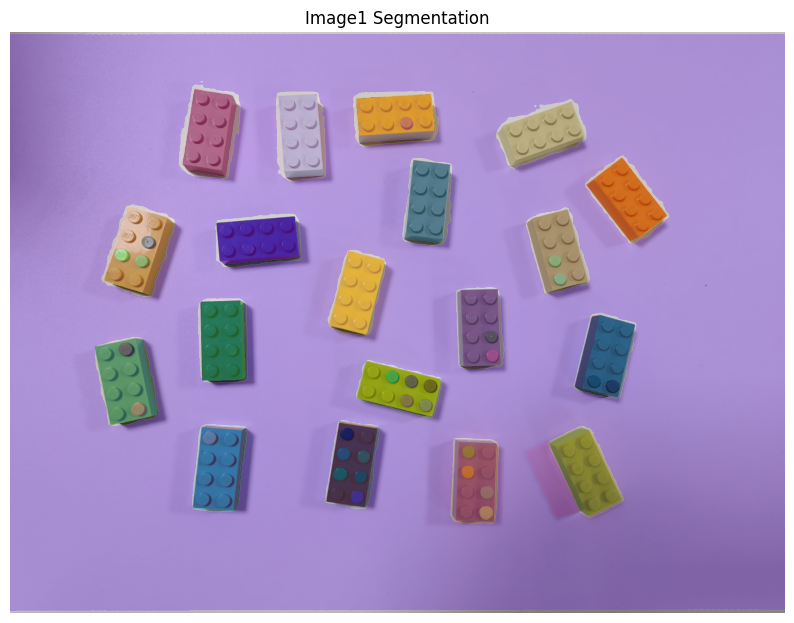

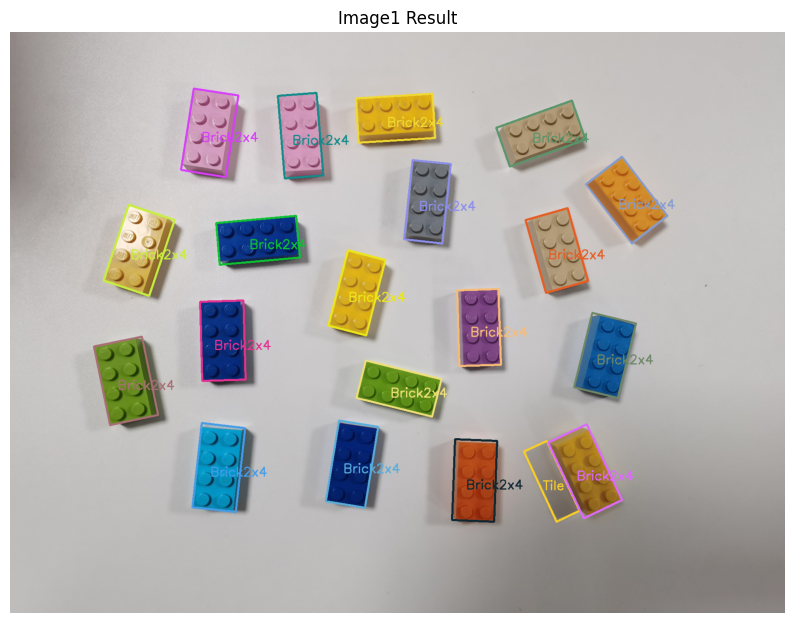

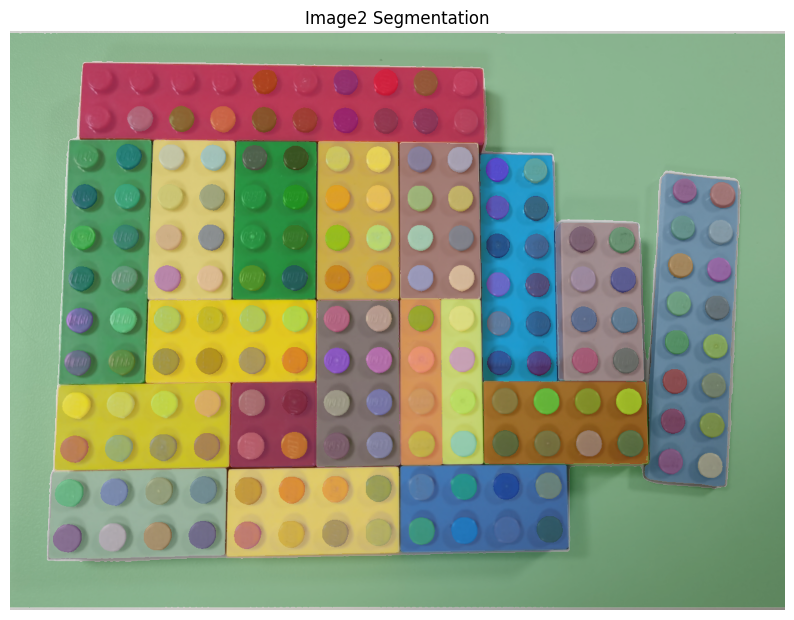

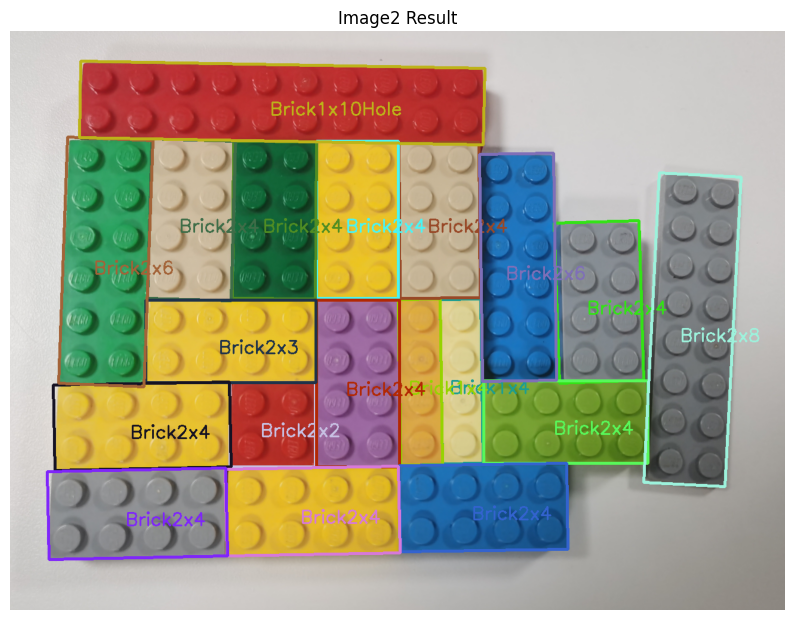

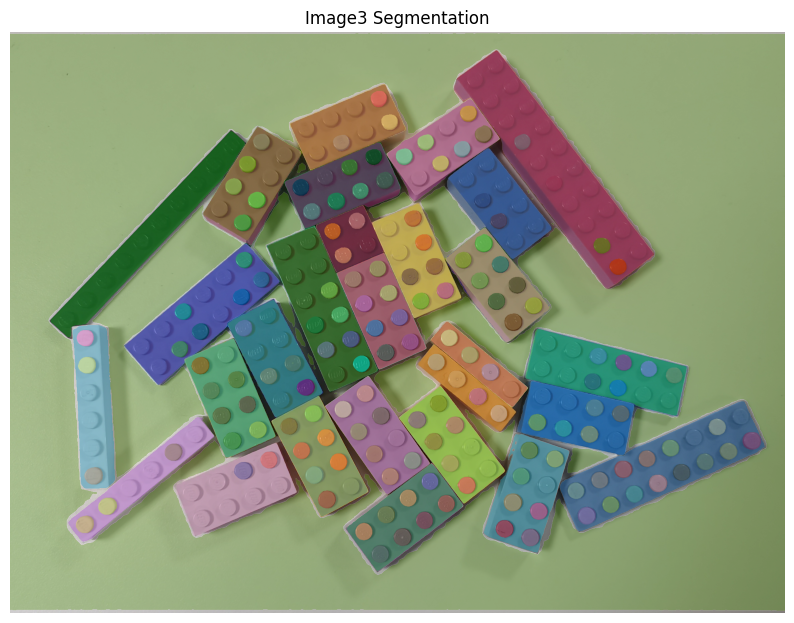

...

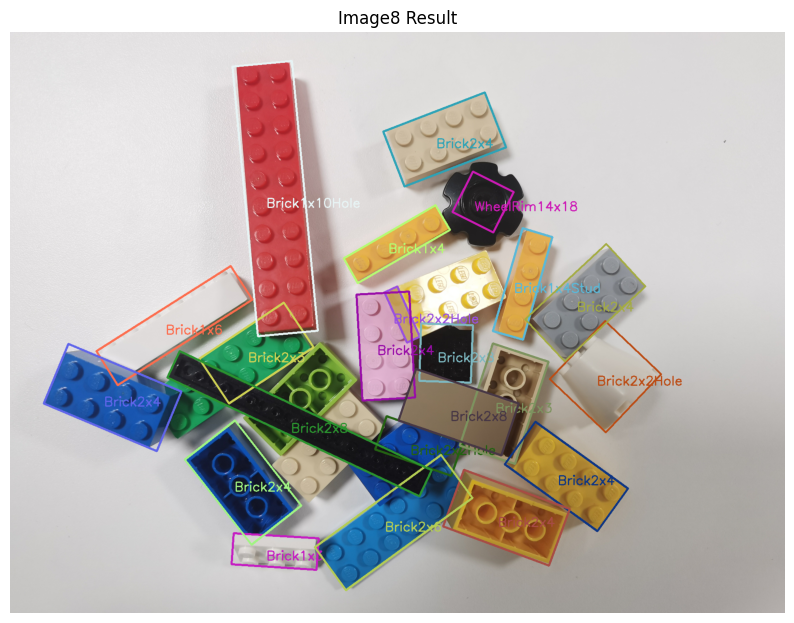

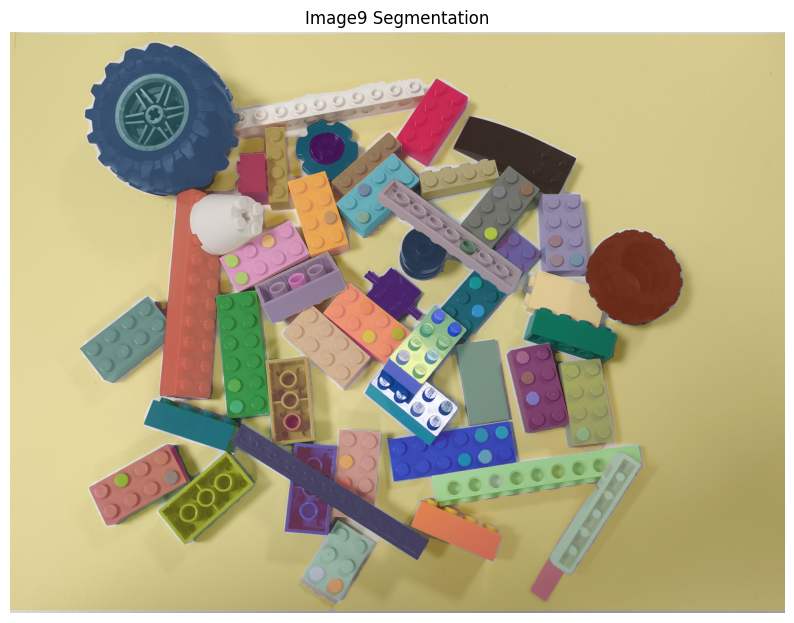

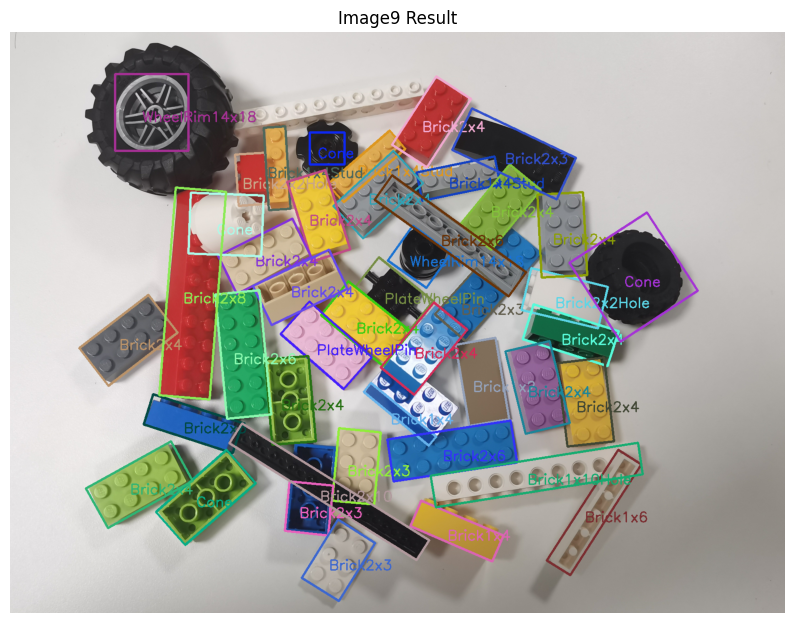

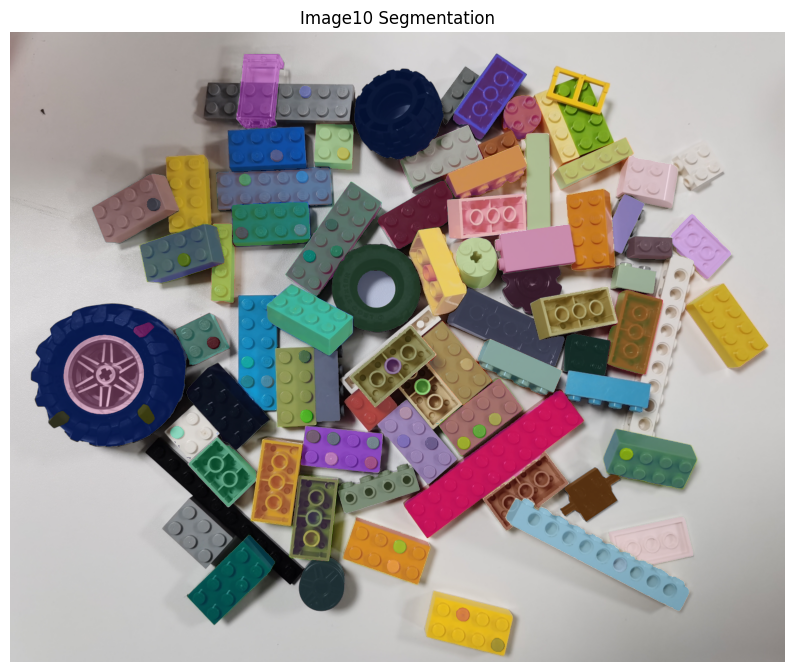

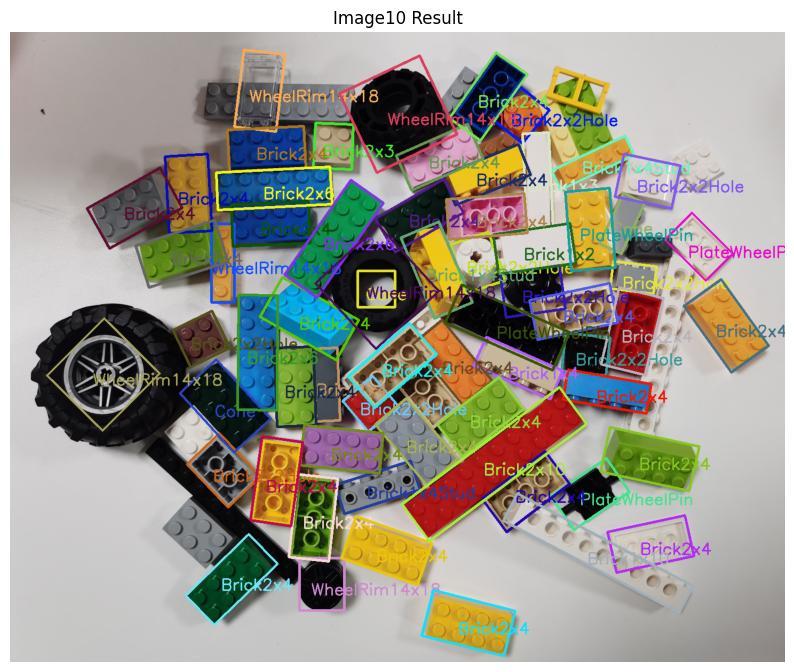

In [13]:
# 处理所有测试图像

lego_counts = {}    # 初始化一个字典来存储每张图片的积木类型计数

for image_idx in range(1,11):

    image_path = f"test_images/{image_idx}.jpg"

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    new_width = int(image.shape[1] * 0.5)
    new_height = int(image.shape[0] * 0.5)
    new_dimensions = (new_width, new_height)

    # 等比例缩放图像
    image = cv2.resize(image, new_dimensions, interpolation=cv2.INTER_AREA)
    # 伽马校正
    image = gamma_correction(image, gamma=1)

    torch.cuda.empty_cache() # 清空未使用的显存
    masks = mask_generator.generate(image)

    plt.figure(figsize=(10,10))
    plt.title(f'Image{image_idx} Segmentation')
    plt.imshow(image)
    show_anns(masks)
    plt.axis('off')
    plt.show()
    torch.cuda.empty_cache() # 清空未使用的显存

    # 滤除面积过小的mask，并使masks按面积降序排列
    masks[:] = [mask for mask in masks if mask['area'] >= 3400]
    masks = sorted(masks, key=(lambda x: x['area']), reverse=False)
    masks.pop(-1)  # 弹出面积最大的mask，用于滤除背景

    # 初始化
    occupied_areas = np.zeros_like(image[:,:,0])    # 记录已经占用的图像区域
    overlap_threshold = 3400     # 过滤图像重叠的阈值
    filtered_masks = []     # 过滤后的掩膜字典
    lego_predict = []

    for index, mask in enumerate(masks):

        # 转化为二值化掩膜
        binary_mask = np.uint8(mask['segmentation'])*255

        # 如果有大面积重叠，则跳过当前积木
        overlap_area = np.sum(np.logical_and(occupied_areas, binary_mask))
        if overlap_area > overlap_threshold:
            continue

        # 将通过条件的mask加入到filtered_masks中
        filtered_masks.append(mask)

        crop_image = lego_crop(binary_mask, image, margin=5)
        predicted_class_idx = predict(classifier, crop_image)
        lego_id = class_dict[predicted_class_idx]
        lego_predict.append(lego_dict[lego_id])

        # 更新已占用区域
        occupied_areas = np.logical_or(occupied_areas, binary_mask)

    # 展示当前图片处理结果
    plt.figure(figsize=(10,10))
    plt.title(f'Image{image_idx} Result')
    plt.axis('off')
    result_image = image.copy()
    result_image = draw_result(filtered_masks, result_image, lego_predict, margin=5, random_color=True)
    plt.imshow(result_image)
    plt.savefig(f'result{image_idx}.jpg')
    plt.show()


    # 计算当前图片中每个类型积木出现的次数
    lego_counter = Counter(lego_predict)
    lego_counts[f'test image{image_idx}'] = lego_counter

# 使用pandas创建一个DataFrame来存储所有图片的积木类型计数
df_lego_counts = pd.DataFrame.from_dict(lego_counts, orient='index').fillna(0).astype(int)
# 保存DataFrame到Excel文件
excel_path = 'lego_counts.xlsx'
df_lego_counts.to_excel(excel_path)



